In [64]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio

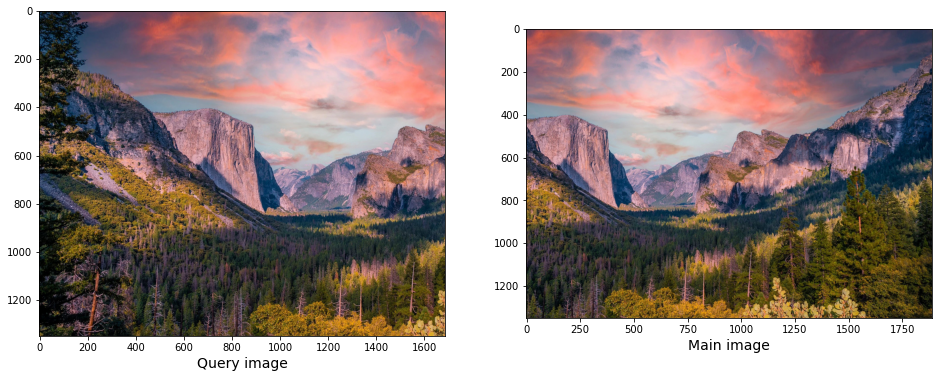

In [65]:
main_photo = cv2.cvtColor( cv2.imread('main.jpg'),cv2.COLOR_BGR2RGB)
main_photo_gray = cv2.cvtColor(main_photo, cv2.COLOR_RGB2GRAY)

query_photo = cv2.cvtColor(cv2.imread('query.jpg'),cv2.COLOR_BGR2RGB)
query_photo_gray = cv2.cvtColor(query_photo, cv2.COLOR_RGB2GRAY)

# Now view/plot the images
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
ax1.imshow(query_photo, cmap="gray")
ax1.set_xlabel("Query image", fontsize=14)

ax2.imshow(main_photo, cmap="gray")
ax2.set_xlabel("Main image", fontsize=14)
plt.show()

Resimlerin ortak noktalarını bulmak için KeyPointlerini belirlemek gerekiyor
- Feature Extraction


In [66]:
def find_key_points(main_photo_gray,query_photo_gray,printMode):
        descriptor = cv2.SIFT_create()
        keypoints_main_img, features_main_img = descriptor.detectAndCompute(main_photo_gray, None)
        keypoints_query_img, features_query_img = descriptor.detectAndCompute(query_photo_gray, None)
        if(printMode):
                print("Query Image Number of KeyPoints",len(keypoints_query_img))
                print("Query Image Shape of Features:",features_query_img.shape)
                
                for keypoint in keypoints_query_img:
                        x,y = keypoint.pt
                        size = keypoint.size 
                        orientation = keypoint.angle
                        response = keypoint.response 
                        octave = keypoint.octave
                        class_id = keypoint.class_id
                #Last Key Point Features
                print("X:",x," Y:",y)
                print("Size",size)
                print("Angle:",orientation)
                print("response:",response)
                print("octave:",octave)
                print("class_id:",class_id)
        return (keypoints_main_img, features_main_img ,keypoints_query_img, features_query_img)

SIFT Methodu ile resimdeki Key Pointleri belirliyoruz (Feature Extraction)

In [67]:
def matching_keys_BF(features_main_img, features_query_img,printMode):
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        best_matches = bf.match(features_main_img,features_query_img)
        rawMatches = sorted(best_matches, key = lambda x:x.distance)
        if(printMode):
                print("Raw matches (Brute force):", len(rawMatches))
        return rawMatches

**matching_keys_BF()** : Main imagede bulunan tüm Key Pointleri, Query imagede bulunan tüm Key Pointlerle karşılaştırarak en yakın olanı bulmaya çalışıyor. 
- Vektörlerin birbirinden uzaklığını hesaplamak için EUCLID Algoritmasını kullanıyor 

In [68]:
def matching_keys_KNN(features_main_img, features_query_img, ratio,printMode):
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        rawMatches = bf.knnMatch(features_main_img, features_query_img, k=2)
        if(printMode):
                print("Raw matches (KNN):", len(rawMatches))
        matches = []

        for m,n in rawMatches:
            if m.distance < n.distance * ratio:
                matches.append(m)
        return matches

**matching_keys_KNN()** : Main imagede bulunan Key Pointleri, Query imagede bulunan Key Pointlerle , K. Nearest Neighboor algoritmasını kullanarak karşılaştırarak optimal olanı bulmaya çalışıyor. 
- "K=2" verdiğimiz için iki tane sonuç dönecek. Bu iki sonucu belli bir oranla çarparak bir eşik değeri belirliyoruz.
- Bu eşik değerinin üstündekinoktayı en iyi eşleşme seçiyoruz ve matches listesine ekliyoruz.

Query Image Number of KeyPoints 18633
Query Image Shape of Features: (18633, 128)
X: 1684.06298828125  Y: 831.1734619140625
Size 1.9988383054733276
Angle: 18.757591247558594
response: 0.027936942875385284
octave: 7733759
class_id: -1


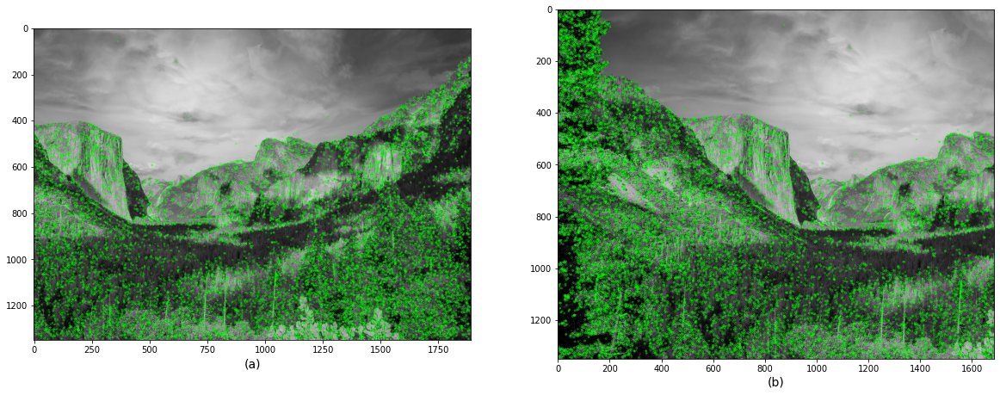

In [69]:
(keypoints_main_img, features_main_img ,keypoints_query_img, features_query_img)=find_key_points(main_photo_gray,query_photo_gray,1)
# display the keypoints and features detected on both images

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)

ax1.imshow(cv2.drawKeypoints(main_photo_gray, keypoints_main_img, None, color=(0,255,0)))

ax1.set_xlabel("(a)", fontsize=14)

ax2.imshow(cv2.drawKeypoints(query_photo_gray,keypoints_query_img,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

plt.show()

Key pointleri çıkartarak resim üzerinde belirttim

In [70]:
def match_features(main_photo,keypoints_main_img,features_main_img,query_photo,keypoints_query_img,features_query_img,mode,printMode):
        if(printMode): 
                print(mode,"matched features Lines")

        fig = plt.figure(figsize=(20,8))

        if mode == 'bf':
                matches = matching_keys_BF(features_main_img, features_query_img,printMode=printMode)
                mapped_features_image = cv2.drawMatches(main_photo,keypoints_main_img,query_photo,keypoints_query_img,matches[:100],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

        elif mode == 'knn':
                matches = matching_keys_KNN(features_main_img, features_query_img, ratio=0.75,printMode=printMode)
                mapped_features_image = cv2.drawMatches(main_photo, keypoints_main_img, query_photo, keypoints_query_img, np.random.choice(matches,100),None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        
        if(printMode):        
                plt.title("Mapped Features with {}".format(mode))
                plt.imshow(mapped_features_image)
                plt.axis('off')
        return matches
        

İki resim arasındaki eşleşmeleri çizgilerle ifade ettim. 


*   Eğer birleştirlecek olan resimler *transformasyon* görmemişse (mesela yan çevirmek) bu çizgiler genellikle paraleldir.
*   Paralelliği bozan çizgiler yüksek ihtimal *Yanlış Eşleşmelerdir*.

knn matched features Lines
Raw matches (KNN): 18457


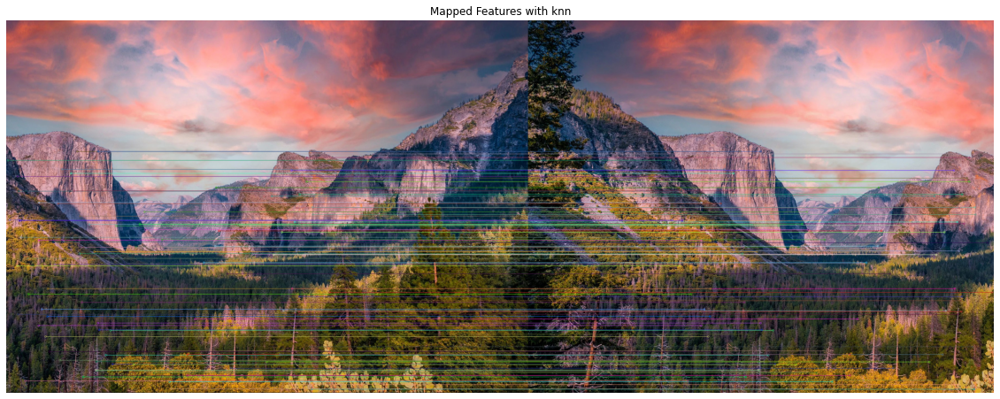

In [71]:
feature_to_match='knn'
matches=match_features(main_photo,keypoints_main_img,features_main_img,query_photo,keypoints_query_img,features_query_img,mode=feature_to_match,printMode=1)

In [72]:
def homography_stitching(keypoints_main_img, keypoints_query_img, matches, reprojThresh):

        keypoints_main_img = float([kp.pt for kp in keypoints_main_img])
        keypoints_query_img = float([kp.pt for kp in keypoints_query_img])

        if len(matches) > 4:
            points_main = float([keypoints_main_img[m.queryIdx] for m in matches])
            points_query = float([keypoints_query_img[m.trainIdx] for m in matches])
            (H, status) = cv2.findHomography(points_main, points_query, cv2.RANSAC, reprojThresh)

            return (matches, H, status)
        else:
            return None


Eşleşen Key Pointlere göre birleştirilecek olan resmin oryantasyonu ve açısı değiştiriliyor 

In [62]:
(matches, Homography_Matrix, status) = homography_stitching(keypoints_main_img, keypoints_query_img, matches, reprojThresh=4)

print("Homography_Matrix:\n",Homography_Matrix)

width = query_photo.shape[1] + main_photo.shape[1]
height = min(query_photo.shape[0], main_photo.shape[0])
print("Width :", width, "\nHeight :",height ) 

result = cv2.warpPerspective(main_photo, Homography_Matrix,  (width, height))

result[0:height, 0:query_photo.shape[1]] = query_photo[0:height,:]
result = cv2.cvtColor(result,cv2.COLOR_RGB2BGR)


Homography_Matrix:
 [[-1.96580175e-05  9.99970608e-01  5.10010976e+02]
 [-9.99999871e-01 -1.71930265e-05  1.34849913e+03]
 [-1.18367688e-08 -1.24634910e-08  1.00000000e+00]]
Width : 3036 
Height : 1350


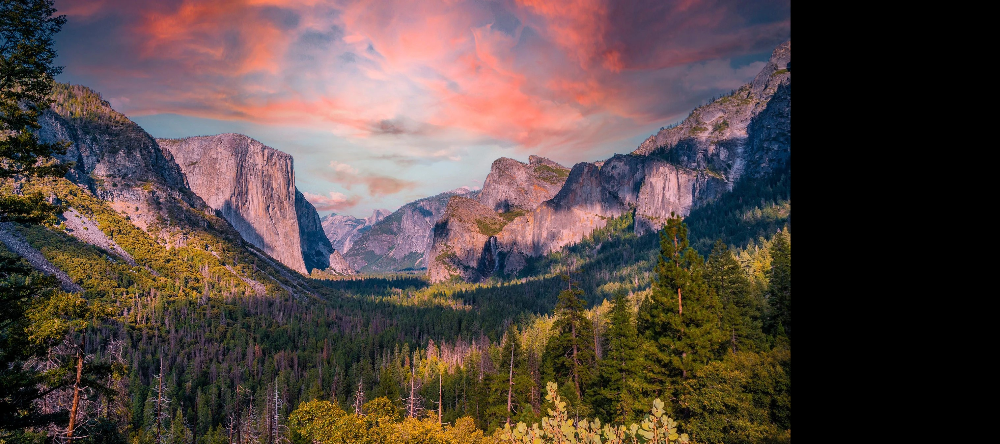

In [73]:
from google.colab.patches import cv2_imshow
cv2_imshow(result)